<div style="padding:20px; 
            color:#8EAC69;
            margin:10px;
            font-size:220%;
            text-align:center;
            display:fill;
            border-radius:20px;
            border-width: 5px;
            border-style: solid;
            border-color: #8EAC69;
            background-color:#363F85;
            overflow:hidden;
            font-weight:500">K-Moyennes pour la segmentation d'images</div>

## <font color='#363F85'>Table des matières<font><a class='anchor' id='toc'></a>
- [1. Import des packages](#packages)
- [2. Import de l'image](#data)
- [3. Visualisation et manipulation de l'image](#viz)
- [4. Compression de l'image](#compression)
- [5. Segmentation de l'image](#segmentation)

## <font color=#363F85>1. Import des packages <a class='anchor' id='packages'></a></font>[↑](#toc)

In [1]:
from PIL import Image, ImageOps
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import MiniBatchKMeans
%matplotlib inline

## <font color=#363F85>2. Import de l'image <a class='anchor' id='data'></a></font>[↑](#toc)

In [2]:
foot_image = Image.open('football.jpg')

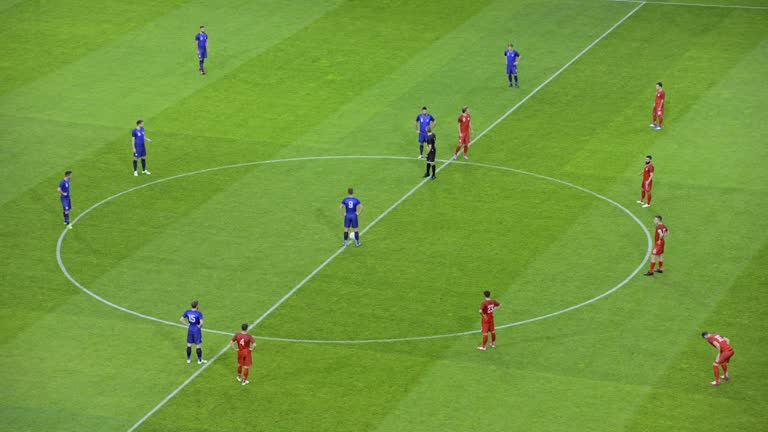

In [3]:
foot_image

## <font color=#363F85>3. Visualisation et manipulation de l'image<a class='anchor' id='viz'></a></font>[↑](#toc)

In [ ]:
foot_array = np.array(foot_image)
print('Shape of the Image : ', foot_array.shape)
#hauteur (Nombre de lignes): 432
#largeur (Nombre de colonnes): 768
# RGB: 3 couleurs

Shape of the Image :  (432, 768, 3)


In [18]:
# Vectorisation de l'image
N_rows, N_cols = foot_array.shape[0], foot_array.shape[1]
image = foot_array.reshape(N_rows * N_cols, 3) #Transformation en matrice 2D avec une ligne = 1 pixel et les colonnes sont R, G, B. 
image = image/255.0 #normalisation
print("taille de l'image", image.shape)
print("4 premiers pixels:\n", image[:4])

taille de l'image (331776, 3)
4 premiers pixels:
 [[0.40392157 0.55294118 0.21960784]
 [0.40392157 0.55294118 0.21960784]
 [0.40392157 0.55294118 0.21960784]
 [0.40392157 0.55294118 0.21960784]]


In [19]:
# Nombre de couleurs uniques dans l'image
len(np.unique(image,axis=0))

22873

## <font color=#363F85>4. Compression de l'image <a class='anchor' id='compression'></a></font>[↑](#toc)

### <font color=#8EAC69>4.1. Pour k=8 </font>[↑](#toc)

In [104]:
#On applique l'algo kmeans pour réduire le nombre de couleurs dans l'image. 
# On choisit MiniBatchKMeans car il gère l'image par petits batchs de données. Ça le rend très efficace pour de grandes images, qui contiennt bcp de pixels.
# C'est bcp plus rapide que KMeabs car vitesse de convergence rapide. 
kmeans = MiniBatchKMeans(8,random_state=42, init='k-means++')
kmeans.fit(image)
image_compressee = kmeans.cluster_centers_[kmeans.predict(image)]

In [22]:
def afficher_compression(image_array, kmeans):
    """
    Affiche l'image originale et l'image compressée en utilisant les résultats de l'algorithme K-means.

    Paramètres :
    image_array (numpy.ndarray) : Tableau représentant l'image originale.
    kmeans (KMeans) : Objet KMeans entraîné sur l'image.
    """

    # Normaliser les valeurs des pixels de l'image
    image = image_array / 255.0

    # Redimensionner l'image en un tableau 2D
    image = image.reshape(-1, 3)

    # Obtenir l'image compressée en utilisant les centroïdes des clusters
    image_compressee = kmeans.cluster_centers_[kmeans.predict(image)]

    # Redimensionner l'image compressée à sa forme originale
    image_compressee = image_compressee.reshape(image_array.shape)

    # Créer une figure avec deux sous-graphiques pour afficher l'image originale et l'image compressée
    fig, ax = plt.subplots(1, 2, figsize=(16, 6), subplot_kw=dict(xticks=[], yticks=[]))
    fig.subplots_adjust(wspace=0.05)

    # Afficher l'image originale
    ax[0].imshow(image_array)
    ax[0].set_title('Image Originale', size=16)

    # Afficher l'image compressée
    ax[1].imshow(image_compressee)
    ax[1].set_title('Compression', size=16)

    # Afficher la figure
    plt.show()

    return image_compressee

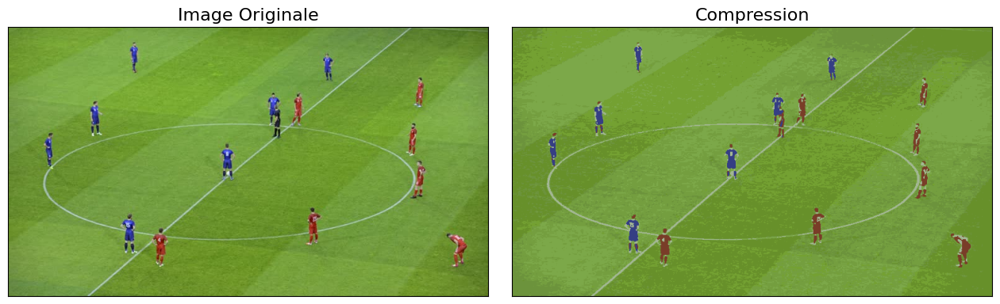

In [105]:
image_compressee = afficher_compression(foot_array, kmeans)

On distingue bien bleu, rouge, blanc + 5 nuances de verts.

### <font color=#8EAC69>4.2. Pour k=4 </font>[↑](#toc)

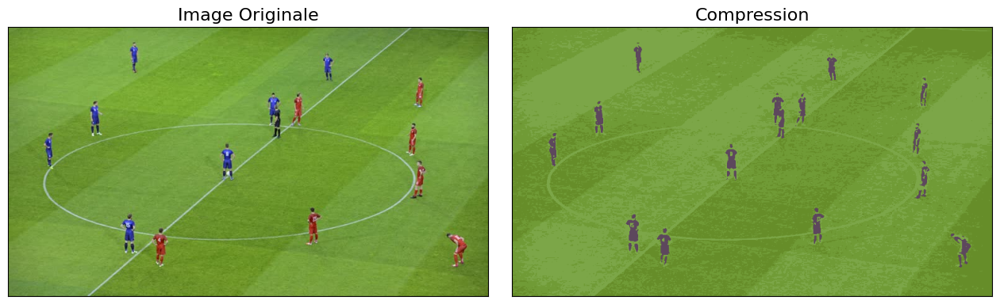

In [108]:
kmeans_4 = MiniBatchKMeans(4, init='k-means++', random_state=42)
kmeans_4.fit(image)
image_compressee = kmeans_4.cluster_centers_[kmeans_4.predict(image)]
image_compressee = afficher_compression(foot_array, kmeans_4)

Instinctivement, je m'attendais à ce qu'on ait un sol tout vert et que les couleurs bleues et rouges soient bien distinctes. A la place, on a 3 variantes de vert et 1 seule couleur pour les joueurs. C'est peut etre random, essayons sans seed.

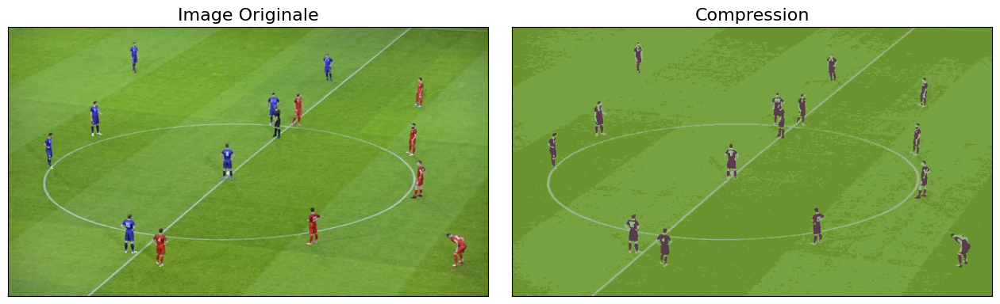

In [109]:
kmeans_4 = MiniBatchKMeans(4, init='k-means++')
kmeans_4.fit(image)
image_compressee = kmeans_4.cluster_centers_[kmeans_4.predict(image)]
image_compressee = afficher_compression(foot_array, kmeans_4)

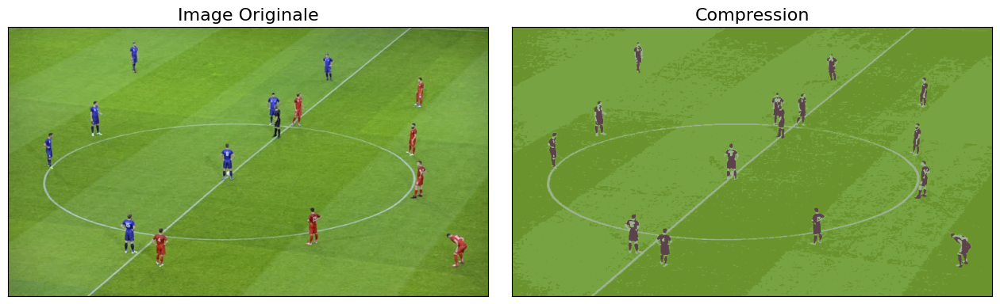

In [110]:
kmeans_4 = MiniBatchKMeans(4, init='k-means++')
kmeans_4.fit(image)
image_compressee = kmeans_4.cluster_centers_[kmeans_4.predict(image)]
image_compressee = afficher_compression(foot_array, kmeans_4)

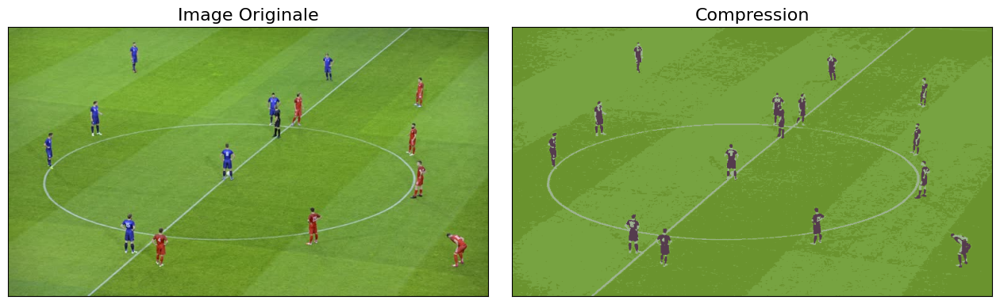

In [111]:
kmeans_4 = MiniBatchKMeans(4, init='k-means++')
kmeans_4.fit(image)
image_compressee = kmeans_4.cluster_centers_[kmeans_4.predict(image)]
image_compressee = afficher_compression(foot_array, kmeans_4)

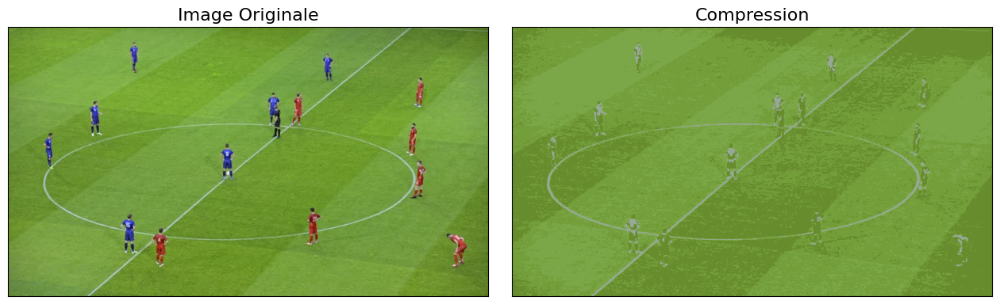

In [112]:
kmeans_4 = MiniBatchKMeans(4, init='k-means++')
kmeans_4.fit(image)
image_compressee = kmeans_4.cluster_centers_[kmeans_4.predict(image)]
image_compressee = afficher_compression(foot_array, kmeans_4)

En fait, ce n'est pas random. D'où qu'on parte, il y a tellement de pixels verts qu'ils agissent comme un centre de gravité qui attire tout.

### <font color=#8EAC69>4.3. Pour k plus grand </font>[↑](#toc)

9 couleurs:


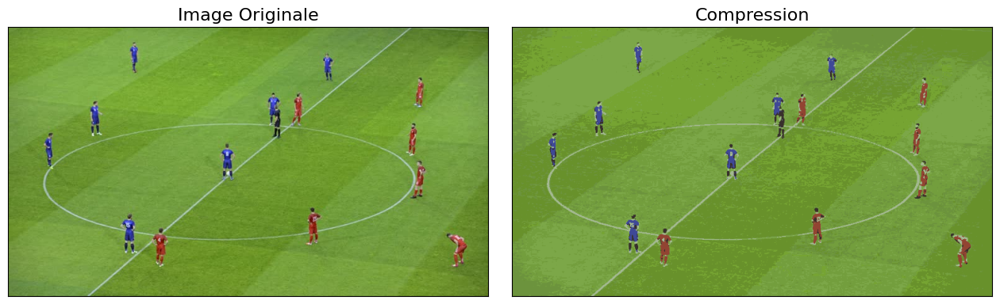

10 couleurs:


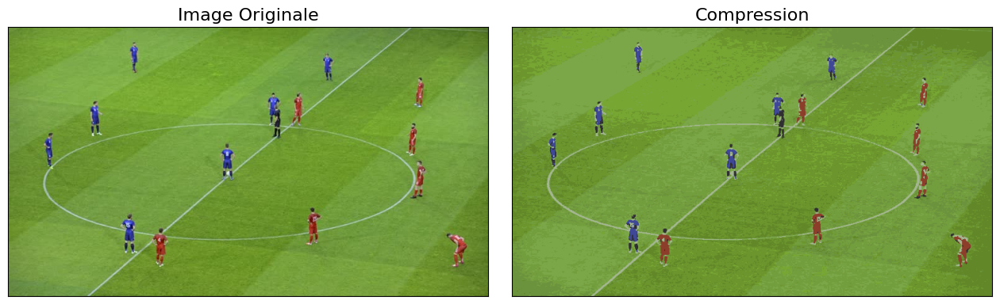

11 couleurs:


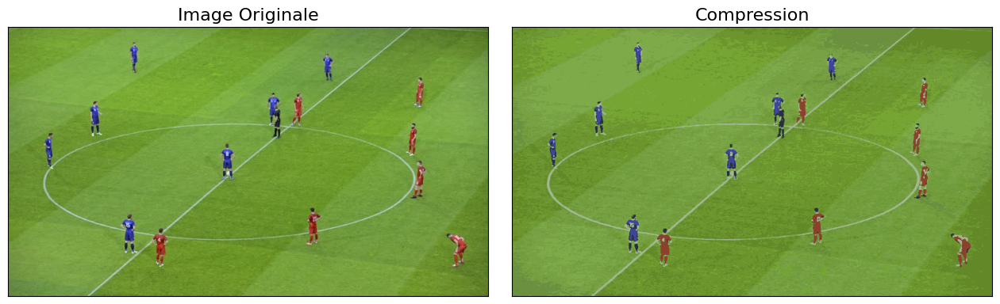

12 couleurs:


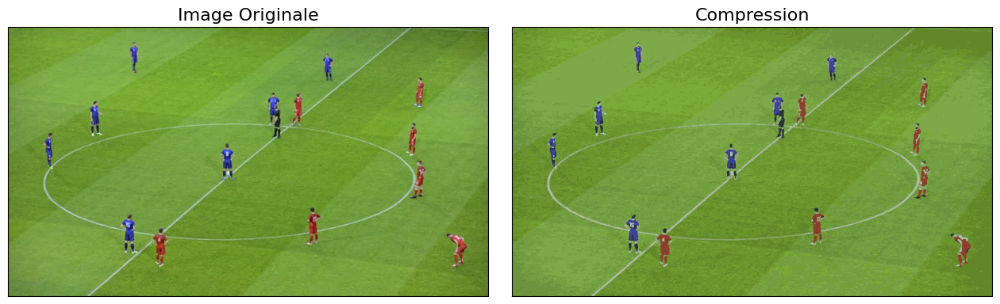

13 couleurs:


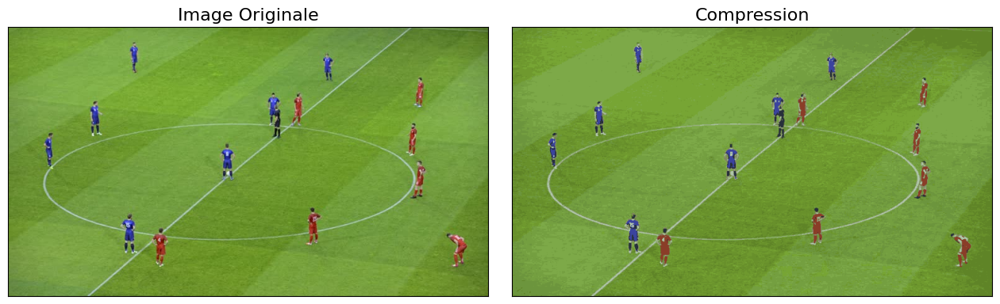

14 couleurs:


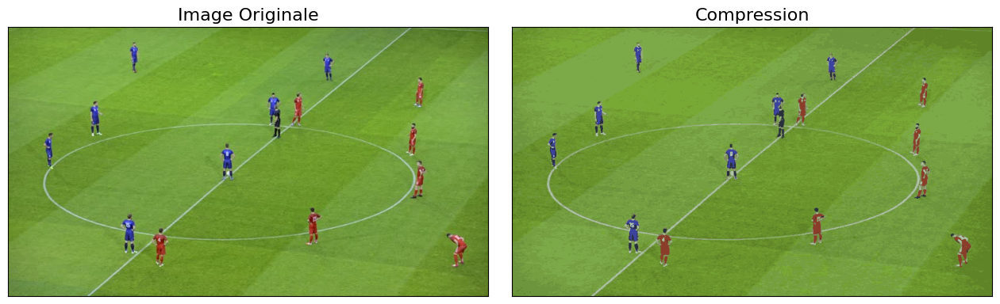

15 couleurs:


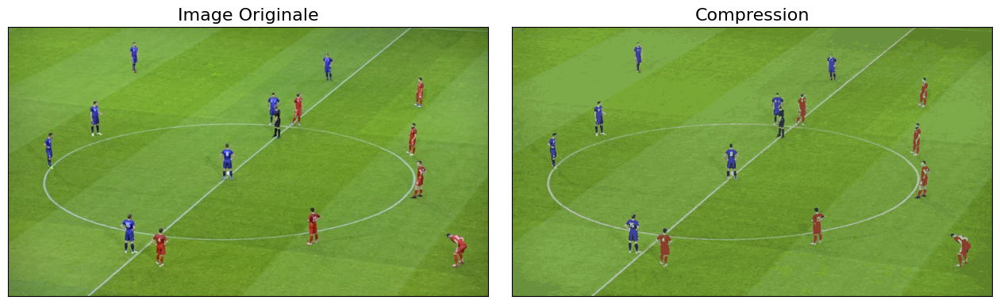

16 couleurs:


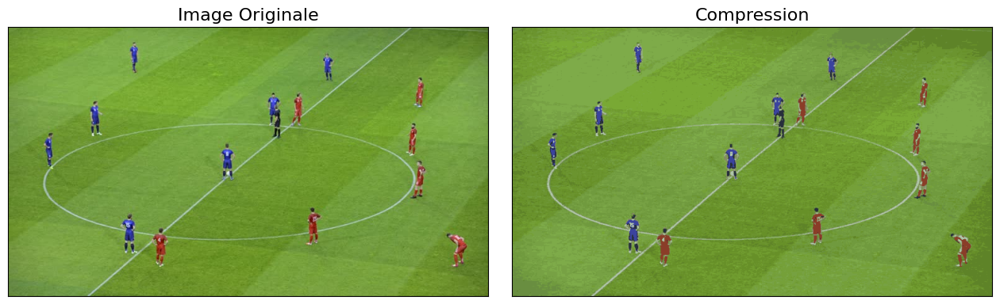

17 couleurs:


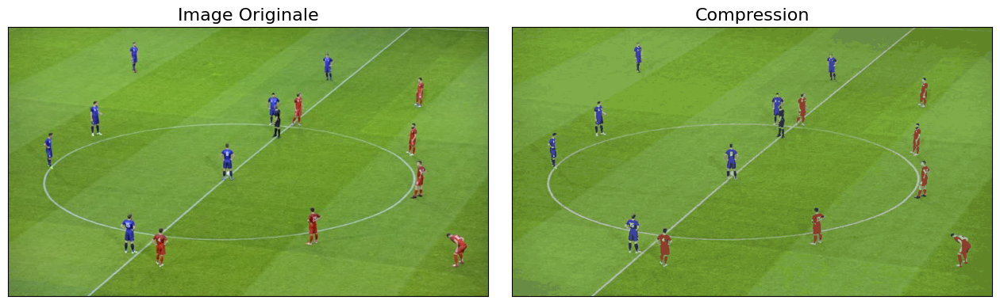

18 couleurs:


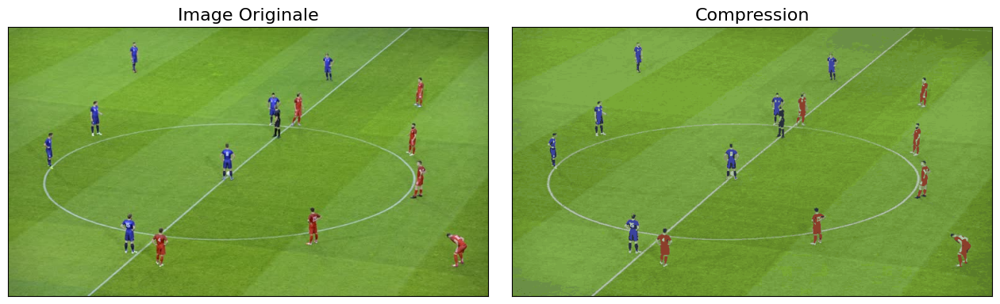

19 couleurs:


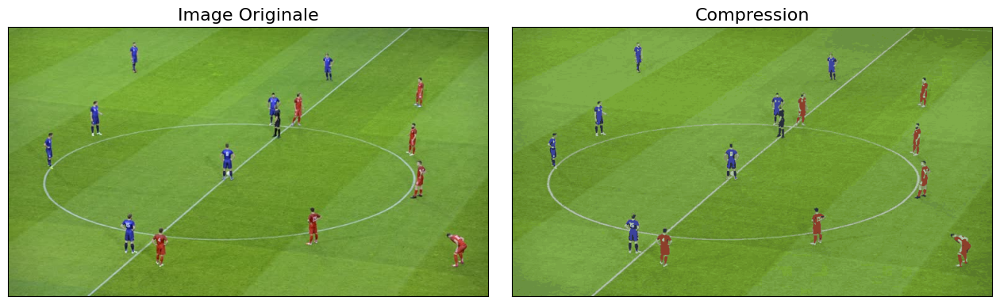

20 couleurs:


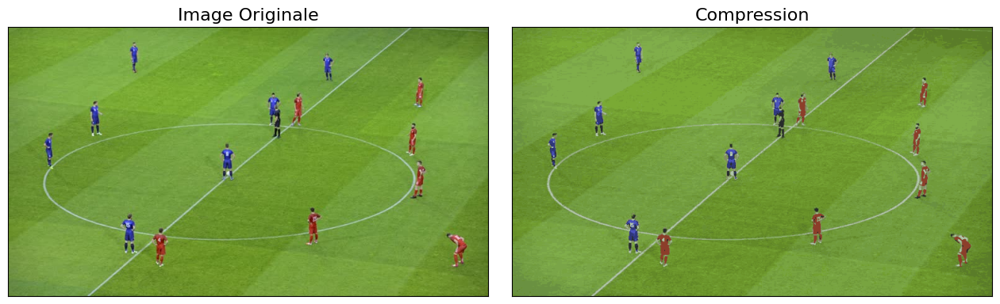

In [120]:
for k in range(9, 21):
    kmeans = MiniBatchKMeans(k, init='k-means++', random_state=42)
    kmeans.fit(image)
    image_compressee = kmeans.cluster_centers_[kmeans.predict(image)]
    print(f"{k} couleurs:")
    image_compressee = afficher_compression(foot_array, kmeans)

A l'oeil humain, c'est kif-kif donc autant laisser à 8 couleurs.

In [122]:
def calculer_taux_compression_couleurs(image_originale, image_compressee):
    """
    Calcule le taux de compression basé sur le nombre de couleurs différentes entre l'image originale et l'image compressée.

    Paramètres :
    image_originale (numpy.ndarray) : Tableau représentant l'image originale.
    image_compressee (numpy.ndarray) : Tableau représentant l'image compressée.

    Retourne :
    float : Taux de compression en pourcentage basé sur le nombre de couleurs.
    """

    # Calculer le nombre de couleurs différentes dans l'image originale
    couleurs_originales = np.unique(image_originale.reshape(-1, 3), axis=0)
    nb_couleurs_originales = len(couleurs_originales)

    # Calculer le nombre de couleurs différentes dans l'image compressée
    couleurs_compressees = np.unique(image_compressee.reshape(-1, 3), axis=0)
    nb_couleurs_compressees = len(couleurs_compressees)

    # Calculer le taux de compression basé sur le nombre de couleurs
    taux_compression_couleurs = (1 - (nb_couleurs_compressees / nb_couleurs_originales)) * 100

    return taux_compression_couleurs

In [124]:
kmeans = MiniBatchKMeans(8,random_state=42, init='k-means++')
kmeans.fit(image)
image_compressee = kmeans.cluster_centers_[kmeans.predict(image)]
calculer_taux_compression_couleurs(foot_array, image_compressee)

99.96502426441656

Super, c'est rentable!

## <font color=#363F85>5. Segmentation de l'image <a class='anchor' id='segmentation'></a></font>[↑](#toc)

In [125]:
kmeans = MiniBatchKMeans(8,random_state=42)
kmeans.fit(image)

MiniBatchKMeans(random_state=42)

In [126]:
def affiche_couleur_clusters(cluster_centers):
    """
    Affiche les couleurs des centres des clusters et écrit le numéro du cluster au centre du patch correspondant.

    Paramètres:
    cluster_centers (numpy.ndarray): un array de taille (K, 3) dans lequel chaque ligne est le centre d'un cluster.
    """
    # On s'assure que l'entrée soit un numpy.ndarray et normalisé entre 0 et 1
    rgb_array = np.array(cluster_centers)

    # Vérifie que l'array est de bonne taille
    if rgb_array.shape[1] != 3:
        raise ValueError("L'array d'entrée doit être de taille (K, 3)")

    # Nombre de couleurs == nombre de clusters 
    N = rgb_array.shape[0]

    # Détermine le nombre de lignes et de colonnes pour la grille
    cols = 10
    rows = (N + cols - 1) // cols

    # Création de la figure
    fig, ax = plt.subplots(figsize=(8, rows*0.8))

    # Affiche chaque couleur dans un carré avec l'index du cluster au centre
    for i in range(N):
        color = rgb_array[i]
        rect = plt.Rectangle((i % cols, -(i // cols)-1), 1, 1, color=color)
        ax.add_patch(rect)
        ax.text(i % cols + 0.5, -(i // cols) - 0.5, '$C_{'+str(i)+'}$', fontsize=15,ha='center', va='center', color='white' if np.mean(color) < 0.5 else 'black')

    # Rend l'image esthétique
    ax.set_xlim(0, cols)
    ax.set_ylim(-rows,0)
    ax.set_axis_off()

    # Affiche les couleurs
    plt.show()

### Visualisation des centres des clusters

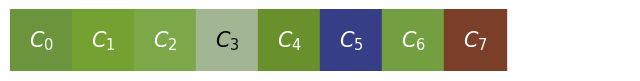

In [127]:
affiche_couleur_clusters(kmeans.cluster_centers_)

C'est bien ce que je voyais à l'oeil nu.

### Isoler les clusters correspondant aux joueurs

In [128]:
def masquer_image(image_array, kmeans, cluster_indices, couleur_masque=[0., 0., 0.]):
    """
    Masque certaines parties d'une image en utilisant les résultats de l'algorithme K-means.

    Paramètres :
    image_array (numpy.ndarray) : Tableau représentant l'image originale.
    kmeans (KMeans) : Objet KMeans entraîné sur l'image.
    cluster_indices (list) : Liste des indices de clusters à conserver.
    couleur_masque (list) : Couleur utilisée pour masquer les clusters non conservés. Par défaut, [0., 0., 0.] (noir).
    """

    # Obtenir le nombre de lignes et de colonnes de l'image
    n_rows, n_cols = image_array.shape[0], image_array.shape[1]

    # Redimensionner l'image en un tableau 2D et normaliser les valeurs des pixels
    image = image_array.reshape(n_rows * n_cols, 3) / 255.0

    # Obtenir l'image compressée en utilisant les centroïdes des clusters
    image_compressee = kmeans.cluster_centers_[kmeans.predict(image)]

    # Obtenir le nombre de clusters
    K = kmeans.n_clusters

    # Masquer les clusters non conservés avec la couleur spécifiée
    for k in range(K):
        if k not in cluster_indices:
            image_compressee[kmeans.labels_ == k] = couleur_masque

    # Redimensionner l'image compressée à sa forme originale
    image_compressee = image_compressee.reshape(image_array.shape)

    # Créer une figure avec deux sous-graphiques pour afficher l'image originale et l'image segmentée
    fig, ax = plt.subplots(1, 2, figsize=(16, 6), subplot_kw=dict(xticks=[], yticks=[]))
    fig.subplots_adjust(wspace=0.05)

    # Afficher l'image originale
    ax[0].imshow(image_array)
    ax[0].set_title('Image originale', size=16)

    # Afficher l'image segmentée
    ax[1].imshow(image_compressee)
    ax[1].set_title('Segmentation', size=16)

    # Afficher la figure
    plt.show()


Je choisis les couleurs qui m'intéressent (un vert, rouge, bleu), le reste sera en blanc.

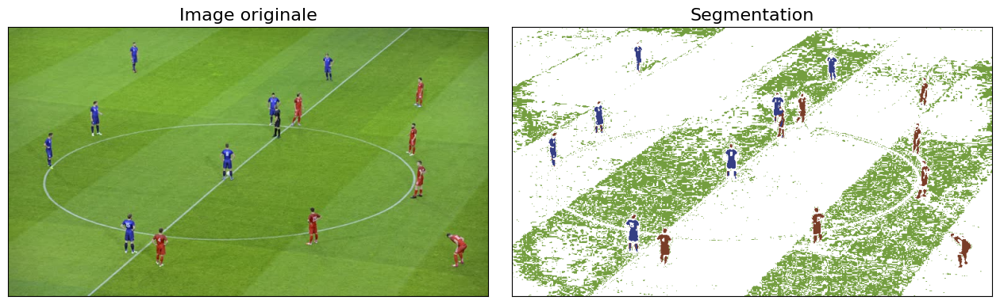

In [140]:
masquer_image(image_array=foot_array, kmeans=kmeans, cluster_indices=[6,7,5], couleur_masque=[1., 1., 1.])

En choisissant un vert différent, je vois quel vert est où:

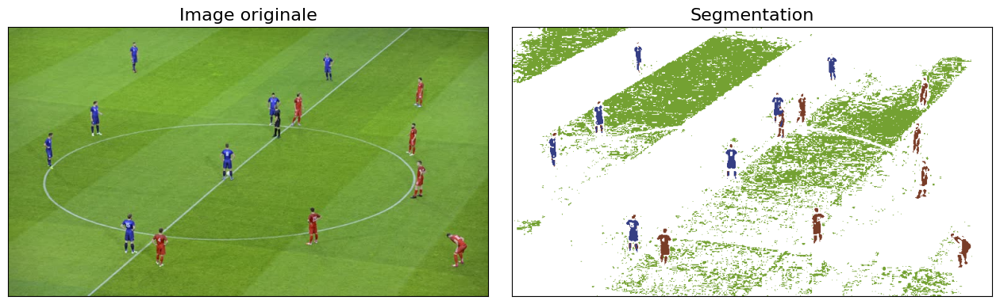

In [141]:
masquer_image(image_array=foot_array, kmeans=kmeans, cluster_indices=[1,7,5], couleur_masque=[1., 1., 1.])

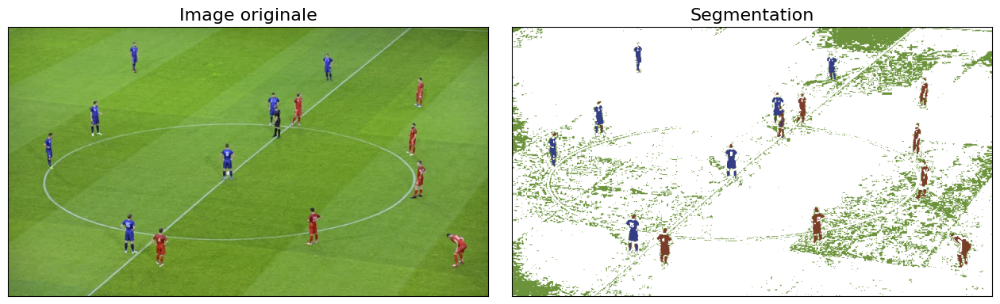

In [150]:
masquer_image(image_array=foot_array, kmeans=kmeans, cluster_indices=[0,7,5], couleur_masque=[1., 1., 1.])

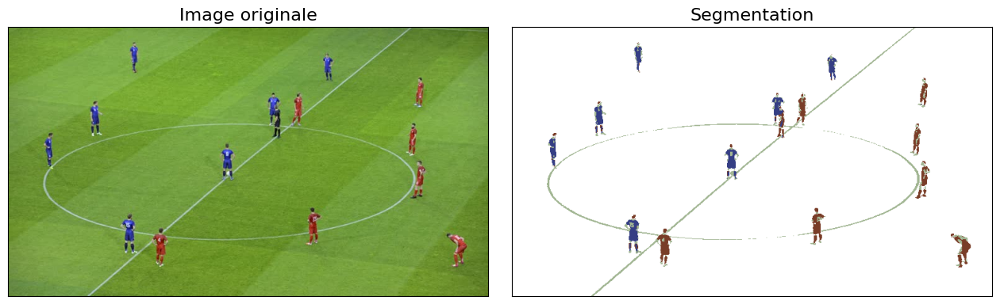

In [144]:
masquer_image(image_array=foot_array, kmeans=kmeans, cluster_indices=[3,7,5], couleur_masque=[1., 1., 1.])

Je cherche la couleur du vert numéro 6

In [149]:
print(kmeans.cluster_centers_[6])

[0.45599254 0.62240849 0.24993533]


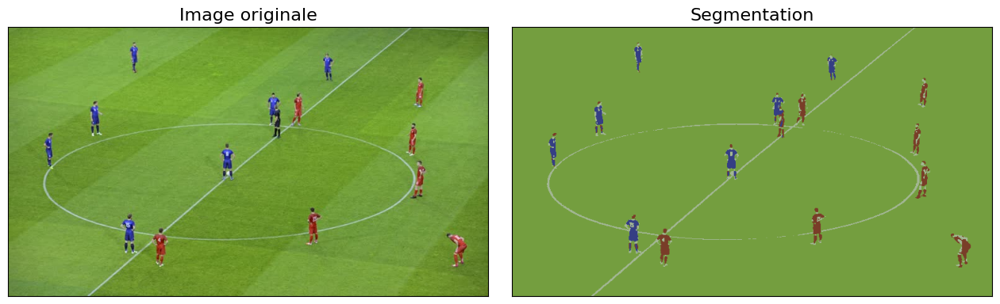

In [154]:
masquer_image(image_array=foot_array, kmeans=kmeans, cluster_indices=[3,7,5], couleur_masque=[0.45599254, 0.62240849, 0.24993533])

J'ai réussi à faire ce que je voulais, un sol vert et une identification des joueurs en fonction de leur équipe!